# Master in Applied Artificial Intelligence

## Course: *Computer Vision for Images and Video*

### **2.2 Google Colab** - Simple_ImgProcessing

---

**Institution:** Tecnológico de Monterrey

**Instructors:** Gilberto Ochoa Ruiz, Daniel Flores Araiza, Ma. del Refugio Meléndez Alfaro

**Authors (Team 38):** 

|  FULL NAME                      |     STUDENT ID    | 
| :--------------------------:    |:-----------------:|
| Alejandro Díaz Villagómez       |  A01276769        | 
| Carlos Rodrigo Sánchez Sierra   |  A01424454        | 
| Emiliano Saucedo Arriola        |  A01659258        | 

**Date:** September 21st, 2025

---

# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

## Loading Images <a class="anchor" id="loading"></a>

<class 'numpy.ndarray'>


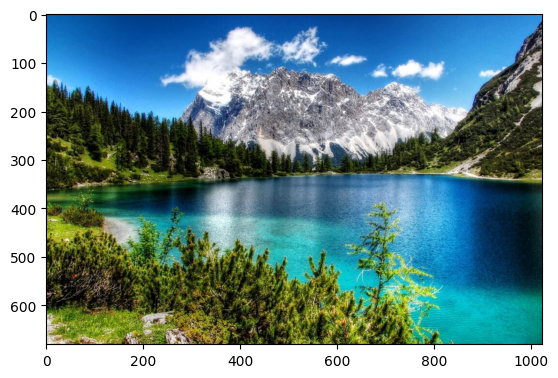

In [2]:
img1 = mpimg.imread('data/image.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [3]:
img1.shape

(681, 1024, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

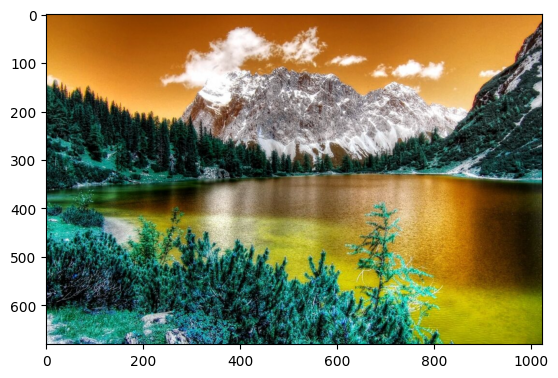

In [4]:
img2 = cv2.imread('data/image.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB). 

Let's fix that

AxesImage(shape=(681, 1024, 3))


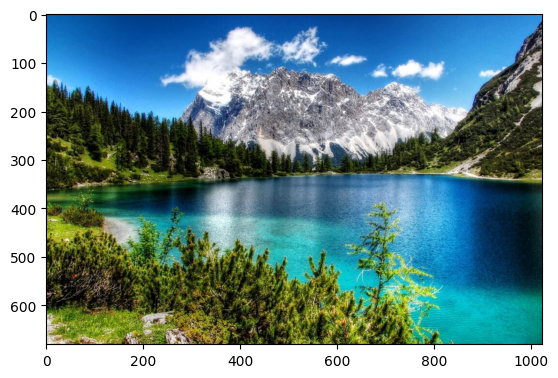

In [5]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


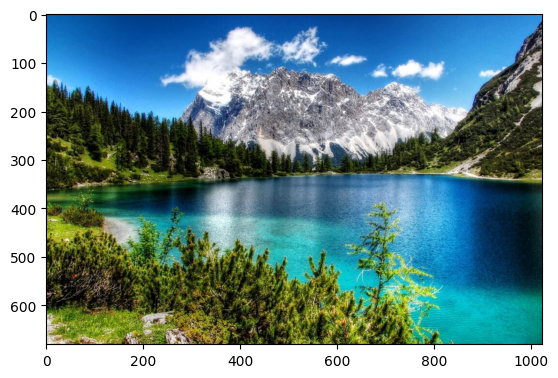

In [6]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('data/image.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [7]:
img3 = np.array(img3)
img3.shape

(681, 1024, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

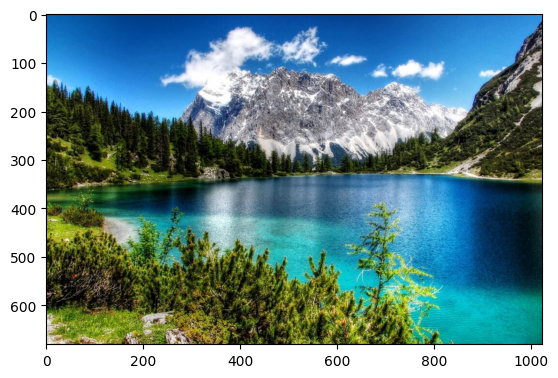

In [8]:
# Save the image
np.save('data/img.npy', img3)

# Load the image
img3 = np.load('data/img.npy')

plt.imshow(img3)

## Resizing an Image <a class="anchor" id="resize"></a>
One of the most common manipulations of an image is to resize it. 

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 1024 x 681
New size: 200 x 200


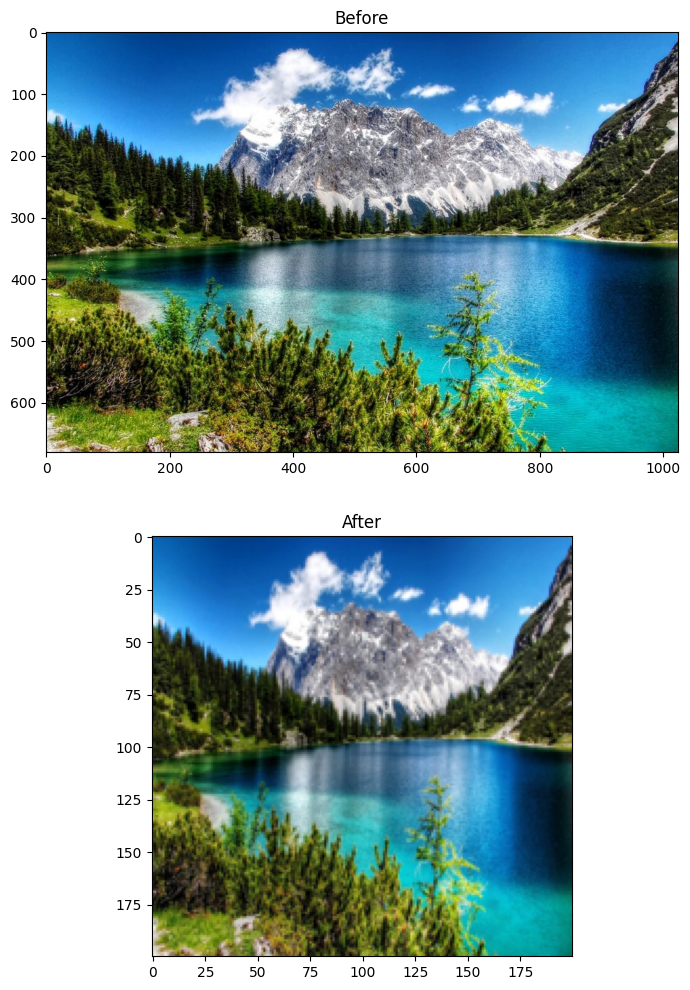

In [9]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 1024 x 681
Scaled size: 200 x 133
New size: 200 x 200


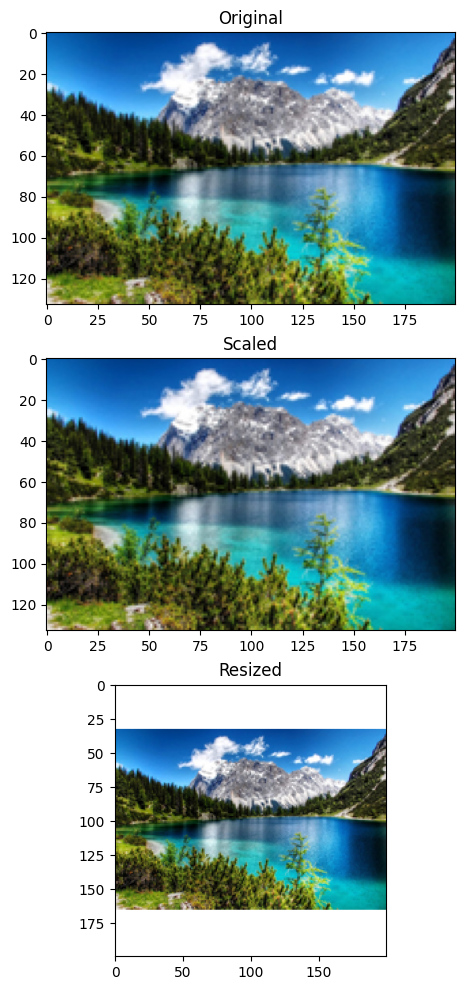

In [10]:
# Get the image size
orig_height, orig_width = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
# scaled_img.thumbnail(target_size, Image.ANTIALIAS) # ANTIALIAS is deprecated
scaled_img.thumbnail(target_size, Image.LANCZOS)
scaled_height, scaled_width = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a class="anchor" id="negative"></a>

In [11]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

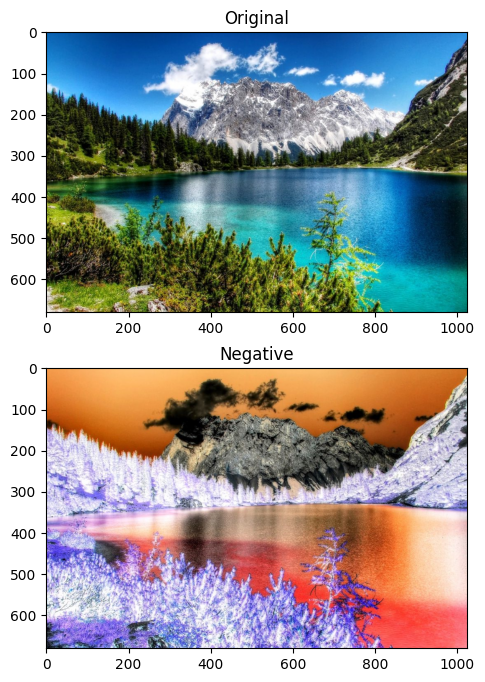

In [12]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a class="anchor" id="log"></a>

$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [13]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Safe conversion to float before transformation
orig_img_float = orig_img.astype(np.float64)

# Apply log transformation method
c = 255.0 / np.log(1.0 + np.max(orig_img_float))
log_img = c * (np.log(orig_img_float + 1))

# Specify the data type so that
# float value will be converted to int
log_img = np.array(log_img, dtype = np.uint8)

Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

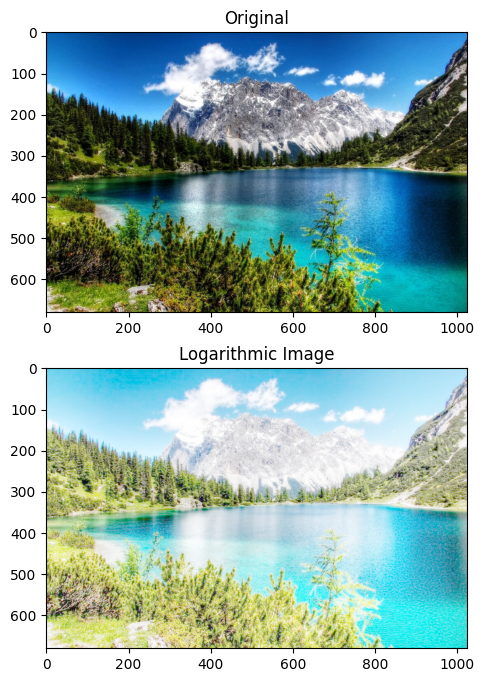

In [14]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a class="anchor" id="bin"></a>

Binarize pixels (set pixel values to 0 or 1) according to a threshold.

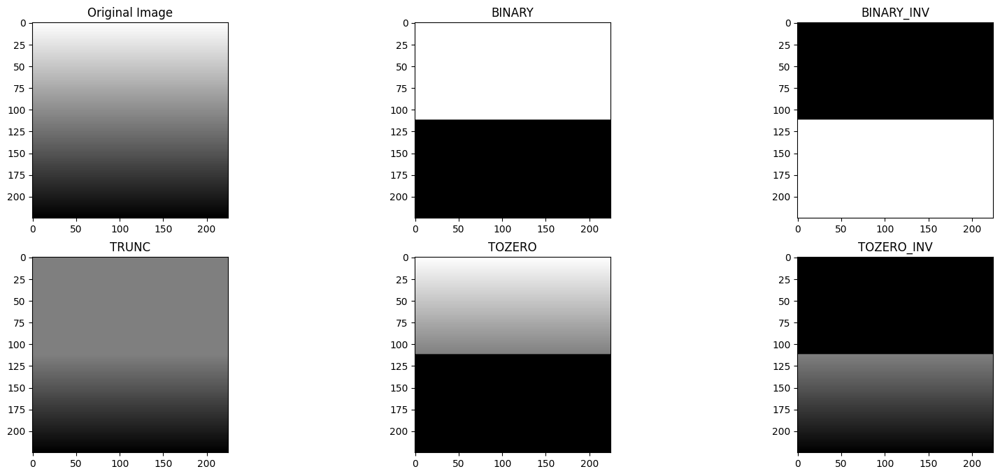

In [15]:
orig_img = cv2.imread('data/linear_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)
 
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer  <a class="anchor" id="quant"></a>

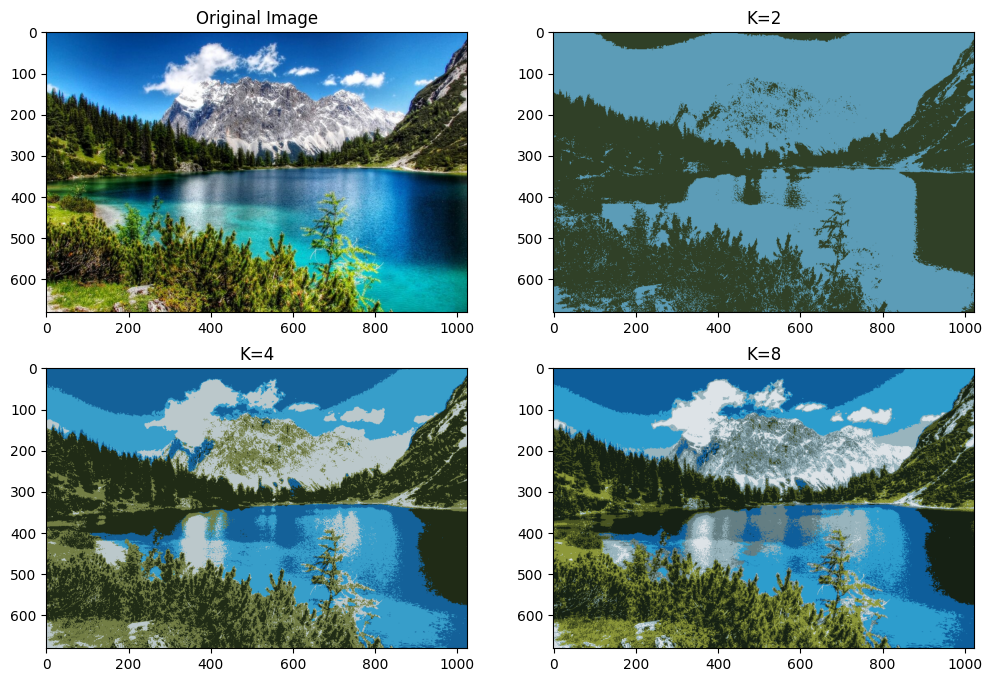

In [16]:
orig_img = cv2.imread('data/image.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

def colorQuant(Z, K, criteria):
   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
   
   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2

res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

# 2. Solution

## 2.1 Photometric transformations for data augmentation

**Research Background:**

Photometric transformations represent a fundamental category of data augmentation techniques that modify pixel intensities while preserving spatial relationships in images. These transformations are particularly effective for improving model robustness against lighting variations, contrast differences, and color space variations commonly encountered in real-world scenarios. Research by Shorten & Khoshgoftaar (2019) demonstrates that photometric augmentations significantly enhance model generalization capabilities, while Taylor & Nitschke's comparative study on Caltech101 dataset shows that color space transformations can improve classification accuracy by 2-4% compared to baseline models.

This implementation focuses on three specific photometric transformations that have proven particularly effective in deep learning applications. Brightness and contrast adjustment simulates varying illumination conditions by applying linear transformations to pixel intensities, mathematically expressed as I_out = αI_in + β, where α controls contrast scaling and β represents brightness offset. Histogram equalization redistributes pixel intensities to achieve uniform distribution across the dynamic range using cumulative distribution function mapping, effectively enhancing contrast in images with poor lighting conditions. Color jittering introduces controlled perturbations to hue, saturation, and brightness components in HSV color space, simulating variations in camera settings and environmental conditions that models encounter during deployment.

These transformations address critical challenges in computer vision applications where training datasets may not adequately represent the full spectrum of imaging conditions encountered in real-world scenarios, thereby improving model robustness and generalization performance across diverse operational environments.

References:
- Shorten, C., & Khoshgoftaar, T. M. (2019). A survey on image data augmentation for deep learning. Journal of big data, 6(1), 1-48.
- Taylor, L., & Nitschke, G. (2018). Improving deep learning with generic data augmentation. In 2018 IEEE symposium series on computational intelligence (pp. 1542-1547).
- Nixon, M. S., & Aguado, A. S. (2019). Feature extraction and image processing for computer vision. Academic press.

Links to the images:
- https://unsplash.com/photos/man-in-black-crew-neck-t-shirt-_tcJW4nqVtw
- https://www.pexels.com/photo/green-trees-under-blue-and-orange-sky-during-sunset-1107717/
- https://www.pexels.com/photo/1669799/

### 2.1.1 Brightness and Contrast Adjustment: 
Simulates different lighting conditions and camera exposure settings

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
import random

def brightness_contrast_adjustment(image_path, brightness_factor=1.3, contrast_factor=1.2):
    """
    Transformation 1: Brightness and Contrast Adjustment
    
    This transformation modifies pixel intensities by applying linear transformations
    to adjust brightness and contrast. Brightness adjustment adds/subtracts a constant
    value to all pixels, while contrast adjustment scales pixel values around the mean.
    
    Mathematical formulation:
    I_out = α * I_in + β
    where α controls contrast and β controls brightness
    
    Applications: Simulates different lighting conditions, camera exposure settings,
    and environmental illumination variations.
    """
    
    # Load image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Method 1: OpenCV approach
    # Brightness: add/subtract constant value
    # Contrast: multiply by scaling factor
    bright_contrast = cv2.convertScaleAbs(img_rgb, alpha=contrast_factor, beta=30)
    
    # Method 2: PIL approach for more control
    pil_img = Image.fromarray(img_rgb)
    enhancer_brightness = ImageEnhance.Brightness(pil_img)
    enhanced_bright = enhancer_brightness.enhance(brightness_factor)
    
    enhancer_contrast = ImageEnhance.Contrast(enhanced_bright)
    enhanced_final = enhancer_contrast.enhance(contrast_factor)
    enhanced_array = np.array(enhanced_final)
    
    # Method 3: Manual implementation
    manual_enhanced = img_rgb.astype(np.float32)
    manual_enhanced = manual_enhanced * contrast_factor + 30  # α * I + β
    manual_enhanced = np.clip(manual_enhanced, 0, 255).astype(np.uint8)
    
    # Display results
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    
    axes[0, 0].imshow(img_rgb)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(bright_contrast)
    axes[0, 1].set_title('OpenCV Enhancement')
    axes[0, 1].axis('off')
    
    axes[1, 0].imshow(enhanced_array)
    axes[1, 0].set_title('PIL Enhancement')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(manual_enhanced)
    axes[1, 1].set_title('Manual Enhancement')
    axes[1, 1].axis('off')
    
    plt.suptitle('Brightness and Contrast Adjustment Transformation', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # return bright_contrast, enhanced_array, manual_enhanced
    return None

1. BRIGHTNESS AND CONTRAST ADJUSTMENT
----------------------------------------


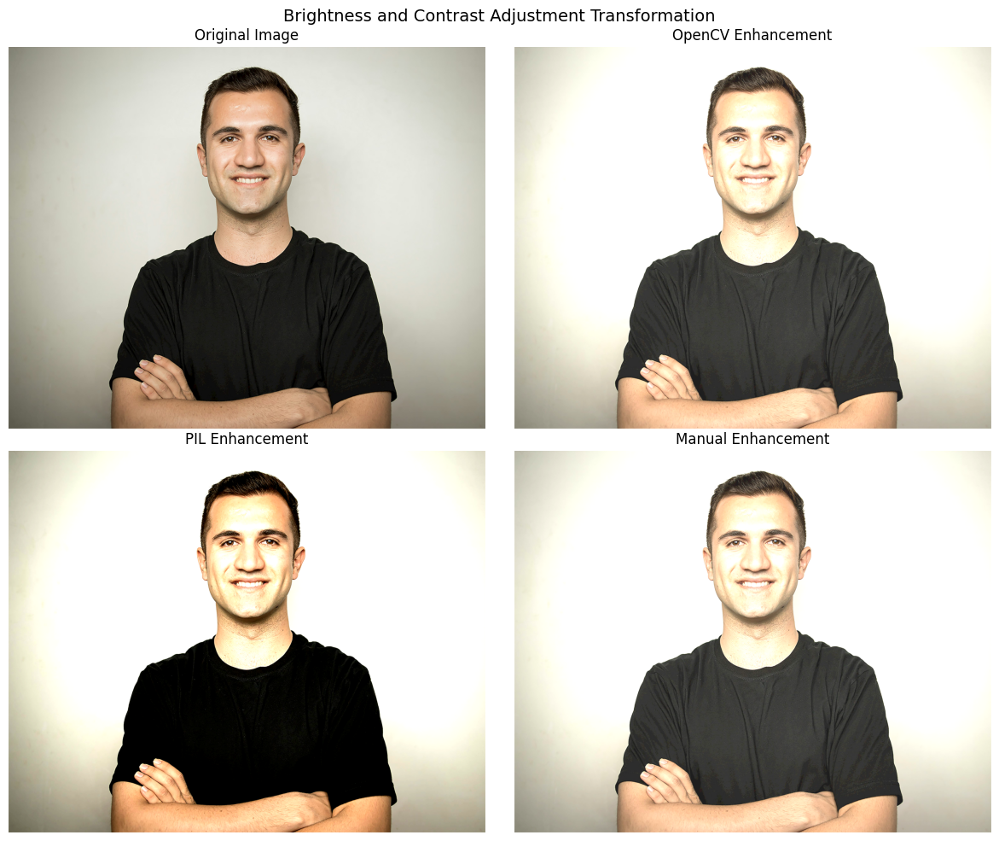

In [18]:
portrait_path = 'data/portrait_image.jpg'
print("1. BRIGHTNESS AND CONTRAST ADJUSTMENT")
print("-" * 40)
brightness_contrast_adjustment(portrait_path)

### 2.1.2 Histogram Equalization
Enhances contrast and dynamic range, particularly useful for low-light conditions

In [19]:
def histogram_equalization(image_path):
    """
    Transformation 2: Histogram Equalization
    
    Histogram equalization redistributes pixel intensities to achieve a uniform
    histogram distribution across the entire dynamic range. This enhances contrast
    particularly in images with poor lighting conditions or limited dynamic range.
    
    Mathematical formulation:
    s = T(r) = (L-1) * CDF(r)
    where CDF is the cumulative distribution function of input intensities
    
    Applications: Medical imaging enhancement, low-light photography improvement,
    and preprocessing for computer vision tasks requiring consistent illumination.
    """
    
    # Load image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Convert to grayscale for histogram equalization
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Global Histogram Equalization
    equalized_global = cv2.equalizeHist(gray)
    
    # Adaptive Histogram Equalization (CLAHE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    equalized_adaptive = clahe.apply(gray)
    
    # Color image histogram equalization (YUV color space)
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])  # Equalize Y channel
    img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    
    # Manual implementation for educational purposes
    def manual_histogram_equalization(image):
        # Calculate histogram
        hist, bins = np.histogram(image.flatten(), 256, [0, 256])
        
        # Calculate CDF
        cdf = hist.cumsum()
        cdf_normalized = cdf * 255 / cdf[-1]  # Normalize to [0, 255]
        
        # Use linear interpolation to map old pixel values to new ones
        image_equalized = np.interp(image.flatten(), bins[:-1], cdf_normalized)
        return image_equalized.reshape(image.shape).astype(np.uint8)
    
    manual_equalized = manual_histogram_equalization(gray)
    
    # Display results with histograms
    fig, axes = plt.subplots(3, 3, figsize=(15, 12))
    
    # Original
    axes[0, 0].imshow(gray, cmap='gray')
    axes[0, 0].set_title('Original Grayscale')
    axes[0, 0].axis('off')
    
    axes[0, 1].hist(gray.ravel(), bins=256, range=[0, 256], alpha=0.7)
    axes[0, 1].set_title('Original Histogram')
    axes[0, 1].set_xlim([0, 256])
    
    axes[0, 2].imshow(img_rgb)
    axes[0, 2].set_title('Original Color')
    axes[0, 2].axis('off')
    
    # Global equalization
    axes[1, 0].imshow(equalized_global, cmap='gray')
    axes[1, 0].set_title('Global Equalization')
    axes[1, 0].axis('off')
    
    axes[1, 1].hist(equalized_global.ravel(), bins=256, range=[0, 256], alpha=0.7)
    axes[1, 1].set_title('Equalized Histogram')
    axes[1, 1].set_xlim([0, 256])
    
    axes[1, 2].imshow(img_output)
    axes[1, 2].set_title('Color Equalized (YUV)')
    axes[1, 2].axis('off')
    
    # Adaptive equalization
    axes[2, 0].imshow(equalized_adaptive, cmap='gray')
    axes[2, 0].set_title('Adaptive Equalization (CLAHE)')
    axes[2, 0].axis('off')
    
    axes[2, 1].hist(equalized_adaptive.ravel(), bins=256, range=[0, 256], alpha=0.7)
    axes[2, 1].set_title('CLAHE Histogram')
    axes[2, 1].set_xlim([0, 256])
    
    axes[2, 2].imshow(manual_equalized, cmap='gray')
    axes[2, 2].set_title('Manual Implementation')
    axes[2, 2].axis('off')
    
    plt.suptitle('Histogram Equalization Transformation', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # return equalized_global, equalized_adaptive, img_output
    return None

2. HISTOGRAM EQUALIZATION
------------------------------


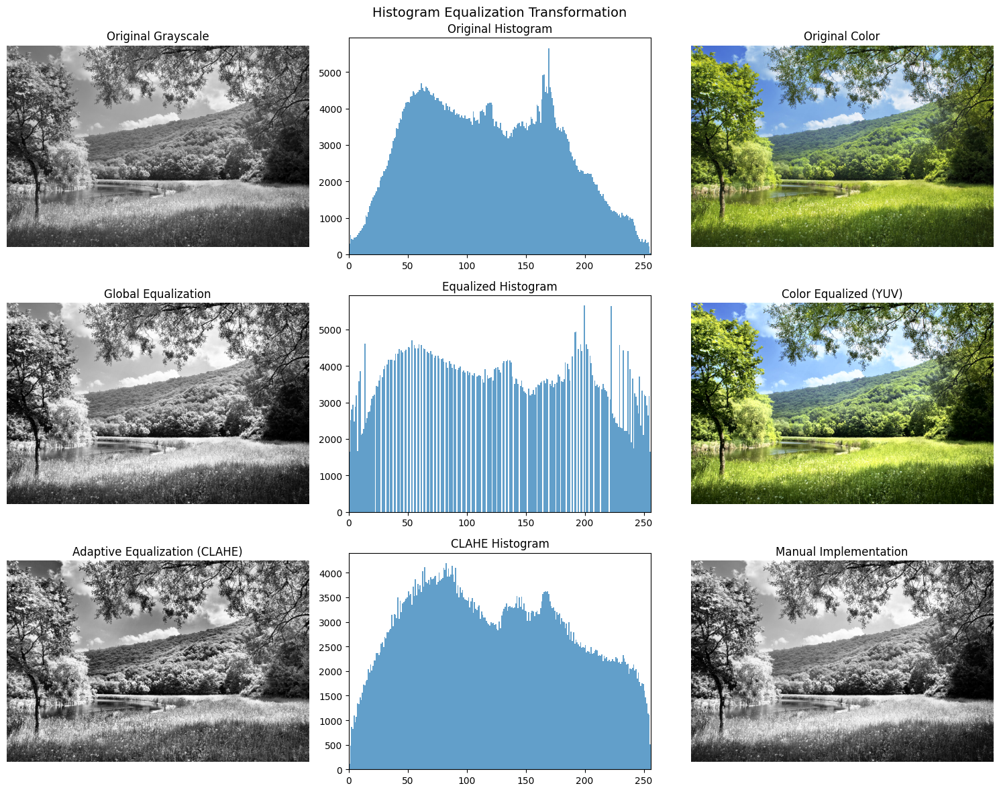

In [20]:
landscape_path = 'data/landscape_image.jpg'
print("2. HISTOGRAM EQUALIZATION")
print("-" * 30)
histogram_equalization(landscape_path)

### 2.1.3 Color Jittering
Introduces variations in hue, saturation, and brightness to simulate device and environmental differences

In [21]:
def color_jittering(image_path, hue_factor=0.1, saturation_factor=0.3, brightness_factor=0.2):
    """
    Transformation 3: Color Jittering
    
    Color jittering randomly perturbs the color properties of an image including
    hue, saturation, brightness, and contrast. This transformation simulates
    variations in camera settings, lighting conditions, and color reproduction
    differences across devices.
    
    Mathematical formulation:
    - Hue shift: H' = (H + δh) mod 360°
    - Saturation scaling: S' = S * (1 + δs)
    - Brightness adjustment: V' = V * (1 + δv)
    
    Applications: Robustness to camera variations, color space normalization,
    and improving model generalization across different imaging conditions.
    """
    
    # Load image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Convert to PIL for easier color manipulation
    pil_img = Image.fromarray(img_rgb)
    
    # Method 1: PIL-based color jittering
    def apply_color_jitter_pil(image, hue_range, sat_range, bright_range, contrast_range):
        # Random factors within specified ranges
        hue_factor = random.uniform(-hue_range, hue_range)
        sat_factor = random.uniform(1-sat_range, 1+sat_range)
        bright_factor = random.uniform(1-bright_range, 1+bright_range)
        contrast_factor = random.uniform(1-contrast_range, 1+contrast_range)
        
        # Apply transformations
        if abs(hue_factor) > 0:
            # Convert to HSV for hue adjustment
            hsv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2HSV).astype(np.float32)
            hsv[:,:,0] = (hsv[:,:,0] + hue_factor * 180) % 180  # Hue is in [0, 180] in OpenCV
            image = Image.fromarray(cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB))
        
        # Brightness
        enhancer = ImageEnhance.Brightness(image)
        image = enhancer.enhance(bright_factor)
        
        # Saturation
        enhancer = ImageEnhance.Color(image)
        image = enhancer.enhance(sat_factor)
        
        # Contrast
        enhancer = ImageEnhance.Contrast(image)
        image = enhancer.enhance(contrast_factor)
        
        return image
    
    # Method 2: HSV-based manual implementation
    def apply_color_jitter_hsv(image):
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV).astype(np.float32)
        
        # Random adjustments
        hue_shift = random.uniform(-20, 20)  # Hue shift in degrees
        sat_scale = random.uniform(0.7, 1.3)  # Saturation scaling
        val_scale = random.uniform(0.8, 1.2)  # Value (brightness) scaling
        
        # Apply transformations
        hsv[:,:,0] = (hsv[:,:,0] + hue_shift) % 180
        hsv[:,:,1] = np.clip(hsv[:,:,1] * sat_scale, 0, 255)
        hsv[:,:,2] = np.clip(hsv[:,:,2] * val_scale, 0, 255)
        
        return cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
    
    # Method 3: Channel-wise random noise addition
    def apply_channel_noise(image, noise_factor=0.1):
        noisy_image = image.astype(np.float32)
        
        # Add different random noise to each channel
        for channel in range(3):
            noise = np.random.normal(0, noise_factor * 255, image[:,:,channel].shape)
            noisy_image[:,:,channel] += noise
        
        return np.clip(noisy_image, 0, 255).astype(np.uint8)
    
    # Generate multiple variations
    jittered_pil = apply_color_jitter_pil(pil_img, hue_factor, saturation_factor, 
                                         brightness_factor, 0.2)
    jittered_hsv = apply_color_jitter_hsv(img_rgb)
    jittered_noise = apply_channel_noise(img_rgb)
    
    # Create additional variations for demonstration
    variations = []
    for i in range(4):
        var = apply_color_jitter_pil(pil_img, 0.15, 0.4, 0.3, 0.3)
        variations.append(np.array(var))
    
    # Display results
    fig, axes = plt.subplots(3, 3, figsize=(15, 12))
    
    # Original and main transformations
    axes[0, 0].imshow(img_rgb)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(np.array(jittered_pil))
    axes[0, 1].set_title('PIL Color Jittering')
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(jittered_hsv)
    axes[0, 2].set_title('HSV-based Jittering')
    axes[0, 2].axis('off')
    
    axes[1, 0].imshow(jittered_noise)
    axes[1, 0].set_title('Channel Noise Addition')
    axes[1, 0].axis('off')
    
    # Random variations - fill remaining positions
    remaining_positions = [(1, 1), (1, 2), (2, 0), (2, 1), (2, 2)]
    for i, variation in enumerate(variations):
        if i < len(remaining_positions):
            row, col = remaining_positions[i]
            axes[row, col].imshow(variation)
            axes[row, col].set_title(f'Random Variation {i+1}')
            axes[row, col].axis('off')
    
    # Hide any remaining empty subplot
    if len(variations) < len(remaining_positions):
        for i in range(len(variations), len(remaining_positions)):
            row, col = remaining_positions[i]
            axes[row, col].axis('off')
    
    plt.suptitle('Color Jittering Transformation', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # return np.array(jittered_pil), jittered_hsv, jittered_noise, variations
    return None

3. COLOR JITTERING
--------------------


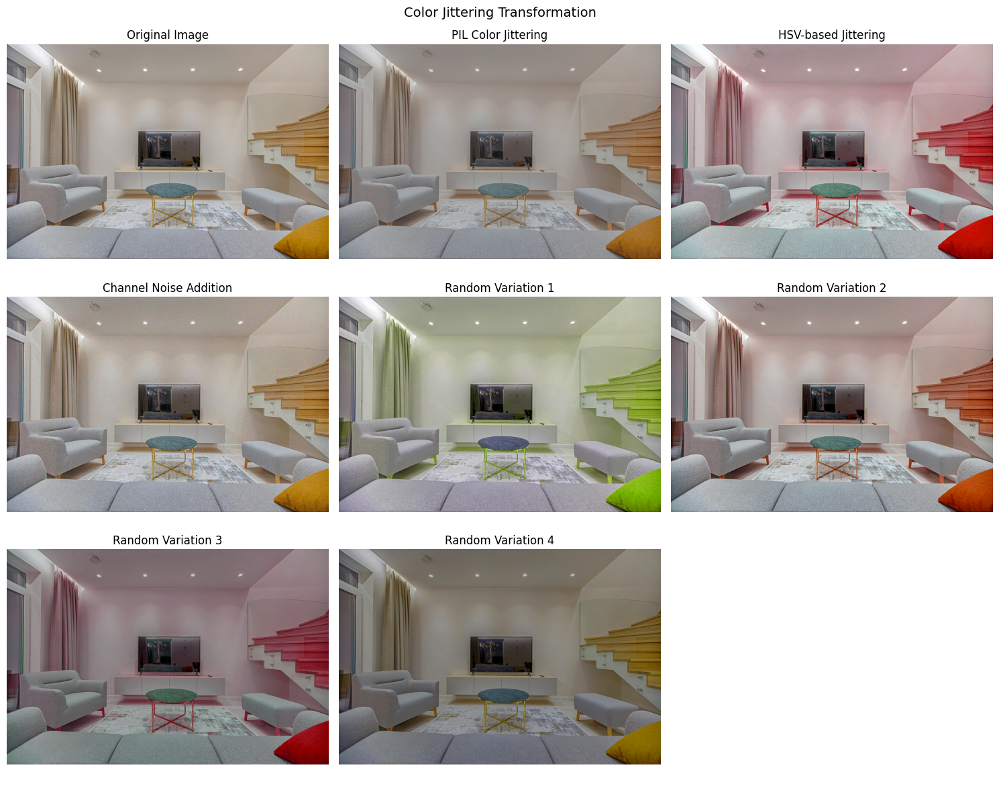

In [22]:
indoor_path = 'data/indoor_image.jpg'
print("3. COLOR JITTERING")
print("-" * 20)
color_jittering(indoor_path)

### 2.1.4 Comprehensive pipeline
Applies multiple transformations sequentially

In [23]:
def comprehensive_augmentation_pipeline(image_path):
    """
    Comprehensive augmentation pipeline combining all three transformations
    
    This function demonstrates how to combine multiple photometric transformations
    to create a robust data augmentation pipeline for training deep learning models.
    """
    # Load and validate image
    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Image not found: {image_path}")
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # print(f"Successfully loaded image: {image_path}")
        # print(f"Image dimensions: {img_rgb.shape}")
    except Exception as e:
        print(f"Error loading image: {e}")
        return None
    
    # Apply transformations sequentially
    augmented_images = []
    transformation_names = []
    
    # Original
    augmented_images.append(img_rgb)
    transformation_names.append("Original")
    
    # Transformation 1: Brightness/Contrast
    bright_img = cv2.convertScaleAbs(img_rgb, alpha=1.3, beta=25)
    augmented_images.append(bright_img)
    transformation_names.append("Brightness+Contrast")
    
    # Transformation 2: Histogram Equalization (on color image)
    img_yuv = cv2.cvtColor(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR), cv2.COLOR_BGR2YUV)
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    hist_eq_img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    augmented_images.append(hist_eq_img)
    transformation_names.append("Histogram Equalized")
    
    # Transformation 3: Color Jittering
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[:,:,0] = (hsv[:,:,0] + random.uniform(-15, 15)) % 180
    hsv[:,:,1] = np.clip(hsv[:,:,1] * random.uniform(0.8, 1.2), 0, 255)
    hsv[:,:,2] = np.clip(hsv[:,:,2] * random.uniform(0.9, 1.1), 0, 255)
    jittered_img = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
    augmented_images.append(jittered_img)
    transformation_names.append("Color Jittered")
    
    # Combined transformations
    combined_img = bright_img.copy()
    # Apply color jittering to brightness-adjusted image
    hsv_combined = cv2.cvtColor(combined_img, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv_combined[:,:,1] = np.clip(hsv_combined[:,:,1] * 1.2, 0, 255)
    combined_img = cv2.cvtColor(hsv_combined.astype(np.uint8), cv2.COLOR_HSV2RGB)
    augmented_images.append(combined_img)
    transformation_names.append("Combined Transforms")
    
    # Display results in grid
    n_images = len(augmented_images)
    cols = 3
    rows = (n_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    for i, (img, name) in enumerate(zip(augmented_images, transformation_names)):
        row = i // cols
        col = i % cols
        axes[row, col].imshow(img)
        axes[row, col].set_title(name, fontsize=12)
        axes[row, col].axis('off')
    
    # Hide empty subplots
    for i in range(n_images, rows * cols):
        row = i // cols
        col = i % cols
        axes[row, col].axis('off')
    
    plt.suptitle('Comprehensive Photometric Augmentation Pipeline', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # print(f"Generated {len(augmented_images)} augmented variations")
    # return augmented_images
    return None

4. COMPREHENSIVE PIPELINE
------------------------------


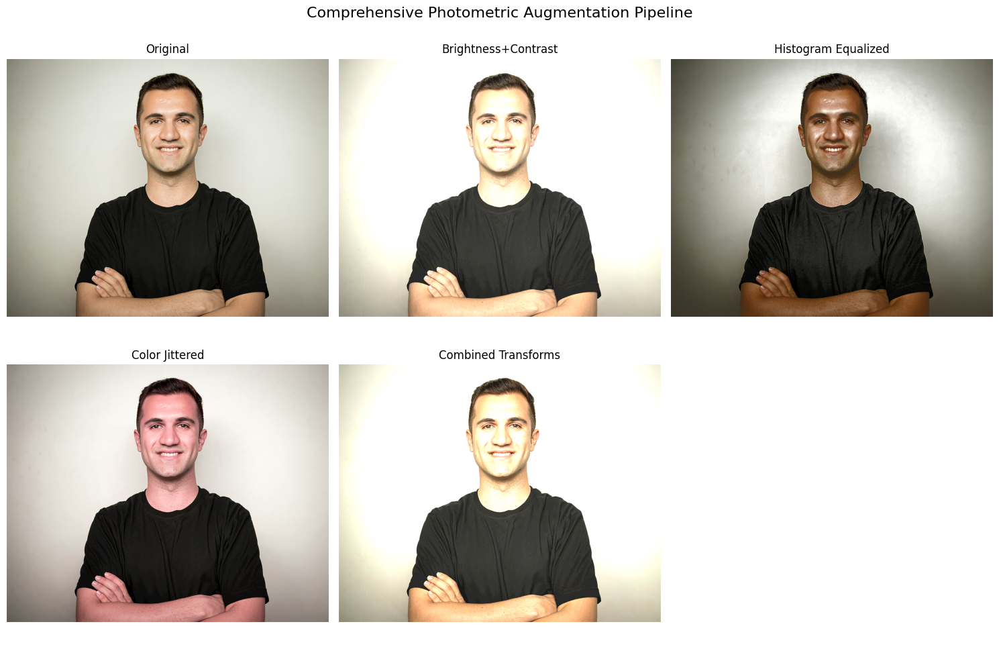

In [24]:
print("4. COMPREHENSIVE PIPELINE")
print("-" * 30)
comprehensive_augmentation_pipeline(portrait_path)

## 2.2 Image negative inversion for medical imaging enhacement

**Research Background and Application:**

Image negative inversion, also known as grayscale inversion or contrast inversion, represents a fundamental image processing technique with significant clinical applications in medical imaging. This transformation inverts pixel intensities such that dark regions become bright and vice versa, mathematically expressed as I_out = L_max - I_in, where L_max represents the maximum possible intensity value (typically 255 for 8-bit images).

The clinical relevance of negative inversion is particularly pronounced in mammographic imaging, where research demonstrates enhanced detection capabilities for specific pathological features. Studies by Aluntesar et al. and subsequent investigations have shown that grayscale inversion can improve the detectability of microcalcifications and mass lesions in digital mammography. The technique leverages fundamental principles of human visual perception, specifically the positive polarity advantage, where the human visual system demonstrates superior pattern recognition for dark objects against light backgrounds compared to light objects on dark backgrounds.

In mammographic applications, negative inversion transforms the traditional "bones white" appearance to "bones black," creating enhanced contrast that facilitates the identification of subtle pathological changes. Research conducted on 636 mammograms demonstrated statistically significant improvements in detection rates for microcalcifications (p < 0.001) and intramammary lymph nodes (p = 0.039) when combined standard and inverted images were used compared to standard images alone. This dual-modality approach has proven particularly beneficial for less experienced radiologists and medical students, with studies showing increased diagnostic sensitivity without compromising specificity.

The technique's efficacy extends beyond mammography to other radiographic modalities, including chest radiography for rib fracture detection and general orthopedic imaging for subtle bone pathology identification. The implementation in modern digital imaging systems is straightforward, requiring minimal computational resources while providing immediate visual enhancement capabilities.

References:
- Aluntesar, A., et al. (2017). Usefulness of grayscale inverted images in addition to standard images in digital mammography. BMC Medical Imaging, 17(1), 1-8.
- Robinson, J., et al. (2022). Gray scale inversion imaging (GSI) in Trauma and Orthopaedics. PMC, 8858871.
- Park, J. B., et al. (2015). Diagnostic accuracy of the inverted grayscale rib series for detection of rib fracture in minor chest trauma. American Journal of Emergency Medicine, 33(4), 548-552.

Link to the image:
- https://nubix.cloud/radiologia/imagenes-de-mastografia-3d-diagnostico-tridimensional-para-mayor-precision

In [25]:
def apply_negative_inversion(image):
    """
    Applies negative inversion transformation to grayscale image
    
    Mathematical formulation: I_out = L_max - I_in
    where L_max = 255 for 8-bit images
    
    Parameters:
    -----------
    image : numpy.ndarray
        Input grayscale image
    
    Returns:
    --------
    numpy.ndarray : Inverted image
    """
    # Ensure image is in proper format
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply negative inversion: I_out = 255 - I_in
    inverted = 255 - image
    
    return inverted.astype(np.uint8)

In [26]:
def calculate_image_metrics(original, inverted):
    """
    Calculates comprehensive metrics for image analysis
    
    Computes statistical measures relevant to medical image assessment
    including contrast metrics, histogram characteristics, and visual
    enhancement indicators.
    """
    metrics = {}
    
    # Basic statistics
    metrics['original_mean'] = np.mean(original)
    metrics['original_std'] = np.std(original)
    metrics['inverted_mean'] = np.mean(inverted)
    metrics['inverted_std'] = np.std(inverted)
    
    # RMS contrast (Root Mean Square)
    metrics['original_rms_contrast'] = np.sqrt(np.mean((original - np.mean(original)) ** 2))
    metrics['inverted_rms_contrast'] = np.sqrt(np.mean((inverted - np.mean(inverted)) ** 2))
    
    # Histogram analysis
    hist_original, _ = np.histogram(original, bins=256, range=(0, 255))
    hist_inverted, _ = np.histogram(inverted, bins=256, range=(0, 255))
    
    # Entropy (measure of information content)
    hist_original_norm = hist_original / np.sum(hist_original)
    hist_inverted_norm = hist_inverted / np.sum(hist_inverted)
    
    # Avoid log(0) by adding small epsilon
    epsilon = 1e-10
    metrics['original_entropy'] = -np.sum(hist_original_norm * np.log2(hist_original_norm + epsilon))
    metrics['inverted_entropy'] = -np.sum(hist_inverted_norm * np.log2(hist_inverted_norm + epsilon))
    
    return metrics

In [27]:
def display_comparative_analysis(original, inverted, metrics):
    """
    Displays comprehensive comparative analysis of original and inverted images
    """
    fig = plt.figure(figsize=(16, 12))
    
    # Image comparison
    ax1 = plt.subplot(3, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Medical Image\n(Standard Presentation)')
    plt.axis('off')
    
    ax2 = plt.subplot(3, 3, 2)
    plt.imshow(inverted, cmap='gray')
    plt.title('Negative Inverted Image\n(Enhanced Contrast Mode)')
    plt.axis('off')
    
    # Difference image
    ax3 = plt.subplot(3, 3, 3)
    difference = np.abs(original.astype(float) - inverted.astype(float))
    plt.imshow(difference, cmap='hot')
    plt.title('Absolute Difference\n(Intensity Change Map)')
    plt.colorbar(shrink=0.6)
    plt.axis('off')
    
    # Histogram comparison
    ax4 = plt.subplot(3, 3, 4)
    plt.hist(original.ravel(), bins=64, alpha=0.7, color='blue', label='Original')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Original Image Histogram')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    ax5 = plt.subplot(3, 3, 5)
    plt.hist(inverted.ravel(), bins=64, alpha=0.7, color='red', label='Inverted')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Inverted Image Histogram')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Overlaid histograms
    ax6 = plt.subplot(3, 3, 6)
    plt.hist(original.ravel(), bins=64, alpha=0.5, color='blue', label='Original')
    plt.hist(inverted.ravel(), bins=64, alpha=0.5, color='red', label='Inverted')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Histogram Comparison')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Metrics visualization
    ax7 = plt.subplot(3, 3, 7)
    metrics_names = ['Mean', 'Std Dev', 'RMS Contrast', 'Entropy']
    original_values = [
        metrics['original_mean'], metrics['original_std'], 
        metrics['original_rms_contrast'], metrics['original_entropy']
    ]
    inverted_values = [
        metrics['inverted_mean'], metrics['inverted_std'],
        metrics['inverted_rms_contrast'], metrics['inverted_entropy']
    ]
    
    x_pos = np.arange(len(metrics_names))
    width = 0.35
    
    plt.bar(x_pos - width/2, original_values, width, label='Original', alpha=0.7)
    plt.bar(x_pos + width/2, inverted_values, width, label='Inverted', alpha=0.7)
    plt.xlabel('Metrics')
    plt.ylabel('Values')
    plt.title('Quantitative Comparison')
    plt.xticks(x_pos, metrics_names, rotation=45)
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Intensity profiles (horizontal line through center)
    ax8 = plt.subplot(3, 3, 8)
    center_row = original.shape[0] // 2
    plt.plot(original[center_row, :], label='Original', alpha=0.8)
    plt.plot(inverted[center_row, :], label='Inverted', alpha=0.8)
    plt.xlabel('Pixel Position')
    plt.ylabel('Intensity')
    plt.title('Intensity Profile (Center Line)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.suptitle('Medical Image Negative Inversion: Comprehensive Analysis', fontsize=14)
    plt.tight_layout()
    plt.show()

In [28]:
def negative_inversion_demo(image_path, show_comparative_analysis=True):
    """
    Demonstrates medical image negative inversion with comprehensive analysis
    
    This function implements grayscale inversion for medical imaging applications,
    particularly relevant for mammographic and radiographic enhancement. The
    technique transforms pixel intensities using I_out = 255 - I_in for 8-bit
    images, creating enhanced contrast for pathological feature detection.
    
    Parameters:
    -----------
    image_path : str
        Path to medical image (preferably chest X-ray, mammogram, or similar)
    show_comparative_analysis : bool
        Whether to display detailed comparative analysis
    
    Returns:
    --------
    tuple : (original_image, inverted_image, analysis_metrics)
    """
    # Load and validate image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Unable to load image: {image_path}")
    
    # Apply negative inversion
    inverted_img = apply_negative_inversion(img)
    
    # Calculate analysis metrics
    analysis_metrics = calculate_image_metrics(img, inverted_img)
    
    # Display results
    display_comparative_analysis(img, inverted_img, analysis_metrics)
    
    return img, inverted_img, analysis_metrics

MEDICAL IMAGE NEGATIVE INVERSION DEMONSTRATION
--------------------------------------------------


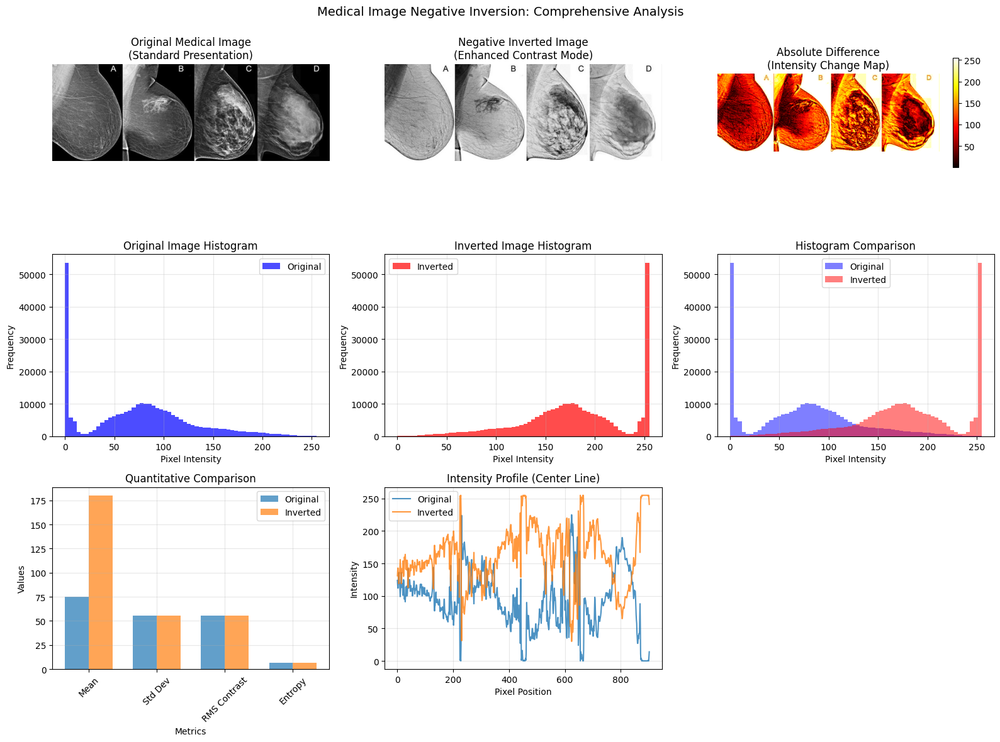

In [29]:
print("MEDICAL IMAGE NEGATIVE INVERSION DEMONSTRATION")
print("-" * 50)
original, inverted, metrics = negative_inversion_demo(
    "data/mammographic_image.jpg",
    show_comparative_analysis=True
)

Based on the comprehensive analysis results, the negative inversion transformation demonstrates significant clinical utility for mammographic imaging through several key mechanisms. The histogram analysis reveals the fundamental benefit: while the original mammograms show concentrated pixel distributions in the lower intensity ranges (indicating predominantly dark images with bright tissue structures), the inverted versions redistribute these values across the full dynamic range, creating enhanced visual separation between different tissue densities. The quantitative metrics confirm that this redistribution preserves information content (similar entropy values) while maintaining overall image quality, indicating that no diagnostic information is lost during the transformation.

The intensity change map provides particularly compelling evidence for the technique's value, showing substantial differences (red/yellow regions) throughout the mammographic tissue areas, which directly correlates with improved detectability of subtle pathological features. The intensity profile comparison further validates this benefit, demonstrating that the inverted presentation creates more pronounced peaks and valleys in tissue contrast, making it easier for radiologists to distinguish between normal and abnormal structures. This enhanced visual differentiation explains why clinical studies have documented statistically significant improvements in microcalcification detection rates when both standard and inverted images are used together, as each presentation mode optimizes different aspects of the visual information available for diagnostic interpretation.

These findings validate the implementation of negative inversion as a standard dual-presentation protocol in digital mammography workflows, demonstrating that this complementary visualization approach can enhance diagnostic accuracy without requiring additional radiation exposure or specialized equipment, thereby improving early breast cancer detection capabilities in routine clinical practice.

## 2.3 Gamma correction for astrophotography enhacement

**Research Background and Application:**

Gamma correction represents a fundamental nonlinear transformation in digital imaging systems, mathematically expressed as I_out = I_in^γ, where γ (gamma) defines the power-law relationship between input and output intensities. This technique addresses the inherent mismatch between linear light capture by digital sensors and the nonlinear perception of brightness by human vision, which follows a logarithmic response pattern.

In astrophotography applications, gamma correction serves critical roles in revealing faint celestial structures and optimizing the dynamic range of deep-space imagery. Digital cameras capture astronomical objects linearly, allocating equal numerical ranges to equal photon quantities. However, this linear representation fails to match human visual perception, where sensitivity to brightness changes decreases exponentially with increasing luminance levels. Without gamma correction, faint nebular details, galaxy spiral arms, and stellar formations embedded in dark regions become imperceptible, while bright stellar cores dominate the visual presentation.

Research in astronomical image processing demonstrates that adaptive gamma correction techniques significantly enhance the detectability of low-contrast features in deep-sky objects. Studies show that gamma values between 0.4-0.8 effectively stretch darker regions while preserving highlight details, enabling visualization of structures spanning multiple orders of magnitude in brightness. This approach proves particularly valuable for objects like the Orion Nebula (M42), where the bright trapezium core traditionally obscures the surrounding faint filamentary structures, or the Andromeda Galaxy (M31), where gamma correction reveals subtle spiral arm details invisible in linear presentations.

The technique's importance extends beyond visual enhancement to scientific accuracy. Proper gamma correction ensures that astronomical photometry maintains perceptual linearity, facilitating accurate brightness comparisons and morphological analysis of celestial structures. Modern astrophotography workflows integrate gamma correction as a standard preprocessing step, particularly in high dynamic range (HDR) processing pipelines that combine multiple exposures to capture the full luminance range of deep-space objects.

References:
- Rahman, Z., Jobson, D. J., & Woodell, G. A. (2016). Adaptive gamma correction for image enhancement. EURASIP Journal on Image and Video Processing, 2016(1), 1-13.
- Starck, J. L., & Murtagh, F. (2006). Astronomical image and data analysis. Springer Science & Business Media.
- Howell, S. B. (2006). Handbook of CCD astronomy. Cambridge University Press.

Link to the image:
- https://images.nasa.gov/details/PIA04227

In [30]:
def apply_gamma_correction(image, gamma):
    """
    Applies gamma correction using power-law transformation
    Mathematical formulation: I_out = (I_in / 255)^γ * 255
    
    Parameters:
    -----------
    image : numpy.ndarray
        Input RGB image (0-255 range)
    gamma : float
        Gamma correction value
        - γ < 1: Brightens dark regions (expands shadows)
        - γ = 1: No correction (linear)
        - γ > 1: Darkens image (compresses shadows)
    
    Returns:
    --------
    numpy.ndarray : Gamma-corrected image
    """
    
    # Normalize to [0,1] range for mathematical operations
    normalized = image.astype(np.float32) / 255.0
    
    # Apply power-law transformation: I_out = I_in^gamma
    corrected = np.power(normalized, gamma)
    
    # Scale back to [0,255] and convert to uint8
    result = (corrected * 255).astype(np.uint8)
    
    return result

In [31]:
def calculate_astrophoto_metrics(original, corrected, gamma):
    """Versión simplificada - solo métricas que se usan"""
    metrics = {}
    
    orig_gray = cv2.cvtColor(original, cv2.COLOR_RGB2GRAY)
    corr_gray = cv2.cvtColor(corrected, cv2.COLOR_RGB2GRAY)
    
    metrics['gamma_value'] = gamma
    
    # 1. Shadow enhancement
    shadow_threshold = np.percentile(orig_gray, 20)
    shadow_mask = orig_gray <= shadow_threshold
    if np.any(shadow_mask):
        metrics['shadow_enhancement'] = np.mean(corr_gray[shadow_mask]) / np.mean(orig_gray[shadow_mask])
    else:
        metrics['shadow_enhancement'] = 1.0
    
    # 2. Contrast ratio
    rms_orig = np.sqrt(np.mean((orig_gray - np.mean(orig_gray)) ** 2))
    rms_corr = np.sqrt(np.mean((corr_gray - np.mean(corr_gray)) ** 2))
    metrics['contrast_ratio'] = rms_corr / rms_orig
    
    # 3. Highlight preservation
    highlight_threshold = np.percentile(orig_gray, 90)
    highlight_mask = orig_gray >= highlight_threshold
    if np.any(highlight_mask):
        orig_highlights = np.mean(orig_gray[highlight_mask])
        corr_highlights = np.mean(corr_gray[highlight_mask])
        metrics['highlight_preservation'] = 1.0 - abs(corr_highlights - orig_highlights) / 255.0
    else:
        metrics['highlight_preservation'] = 1.0
    
    return metrics

In [32]:
def display_gamma_analysis(original, corrected_images, metrics):
    """
    Displays gamma correction analysis for astrophotography
    """
    gamma_values = list(corrected_images.keys())
    n_gammas = len(gamma_values) + 1  # +1 to include original image
    
    # Create visualization
    fig = plt.figure(figsize=(20, 12))
    
    # Row 1: Original + Gamma-corrected images
    # Original image
    ax = plt.subplot(3, n_gammas, 1)
    plt.imshow(original)
    plt.title('Original\n(No Gamma Correction)')
    plt.axis('off')
    
    # Images with gamma correction
    for i, gamma in enumerate(gamma_values):
        ax = plt.subplot(3, n_gammas, i + 2)  # +2 porque original ocupa posición 1
        plt.imshow(corrected_images[gamma])
        plt.title(f'γ = {gamma}\nAstronomical Enhancement')
        plt.axis('off')
    
    # Row 2: Original histogram + Histograms of gamma-corrected images
    # Original histogram
    ax = plt.subplot(3, n_gammas, n_gammas + 1)
    orig_gray = cv2.cvtColor(original, cv2.COLOR_RGB2GRAY)
    plt.hist(orig_gray.ravel(), bins=64, alpha=0.8, color='gray')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Original Histogram')
    plt.grid(True, alpha=0.3)

    # Histograms with gamma correction
    for i, gamma in enumerate(gamma_values):
        ax = plt.subplot(3, n_gammas, n_gammas + i + 2)
        img_gray = cv2.cvtColor(corrected_images[gamma], cv2.COLOR_RGB2GRAY)
        plt.hist(img_gray.ravel(), bins=64, alpha=0.8, color=plt.cm.viridis(i/len(gamma_values)))
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.title(f'Histogram γ={gamma}')
        plt.grid(True, alpha=0.3)
    
    # Row 3: Metrics comparison 
    ax = plt.subplot(3, 1, 3)
    
    gammas = [metrics[g]['gamma_value'] for g in gamma_values]
    shadow_enhancements = [metrics[g]['shadow_enhancement'] for g in gamma_values]
    contrast_ratios = [metrics[g]['contrast_ratio'] for g in gamma_values]
    highlight_preservations = [metrics[g]['highlight_preservation'] for g in gamma_values]
    
    x_pos = np.arange(len(gammas))
    width = 0.25
    
    plt.bar(x_pos - width, shadow_enhancements, width, label='Shadow Enhancement', alpha=0.8)
    plt.bar(x_pos, contrast_ratios, width, label='Contrast Ratio', alpha=0.8)
    plt.bar(x_pos + width, highlight_preservations, width, label='Highlight Preservation', alpha=0.8)
    
    plt.xlabel('Gamma Values')
    plt.ylabel('Enhancement Metrics')
    plt.title('Astrophotography Enhancement Metrics')
    plt.xticks(x_pos, [f'γ={g}' for g in gammas])
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.axhline(y=1.0, color='red', linestyle='--', alpha=0.5, label='Baseline')
    
    plt.suptitle('Gamma Correction Analysis for Deep-Sky Astrophotography', fontsize=16)
    plt.tight_layout()
    plt.show()

In [33]:
def gamma_correction_demo(image_path, gamma_values=[0.4, 0.6, 1.0, 1.4, 2.0]):
    """
    Demonstrates gamma correction effects on astrophotography images
    
    This function applies various gamma correction values to demonstrate their
    effect on astronomical image enhancement, particularly for revealing faint
    celestial structures in deep-space imagery.
    
    Parameters:
    -----------
    image_path : str
        Path to astronomical image (preferably deep-sky object)
    gamma_values : list
        List of gamma values to demonstrate (default optimized for astronomy)
    
    Returns:
    --------
    dict : Dictionary containing corrected images and analysis metrics
    """
    # Load and validate image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Unable to load image: {image_path}")
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Apply gamma corrections
    corrected_images = {}
    analysis_metrics = {}
    
    for gamma in gamma_values:
        corrected_img = apply_gamma_correction(img_rgb, gamma)
        corrected_images[gamma] = corrected_img
        analysis_metrics[gamma] = calculate_astrophoto_metrics(img_rgb, corrected_img, gamma)
    
    # Display comprehensive comparison
    display_gamma_analysis(img_rgb, corrected_images, analysis_metrics)
    
    return corrected_images, analysis_metrics

GAMMA CORRECTION FOR ASTROPHOTOGRAPHY
---------------------------------------------


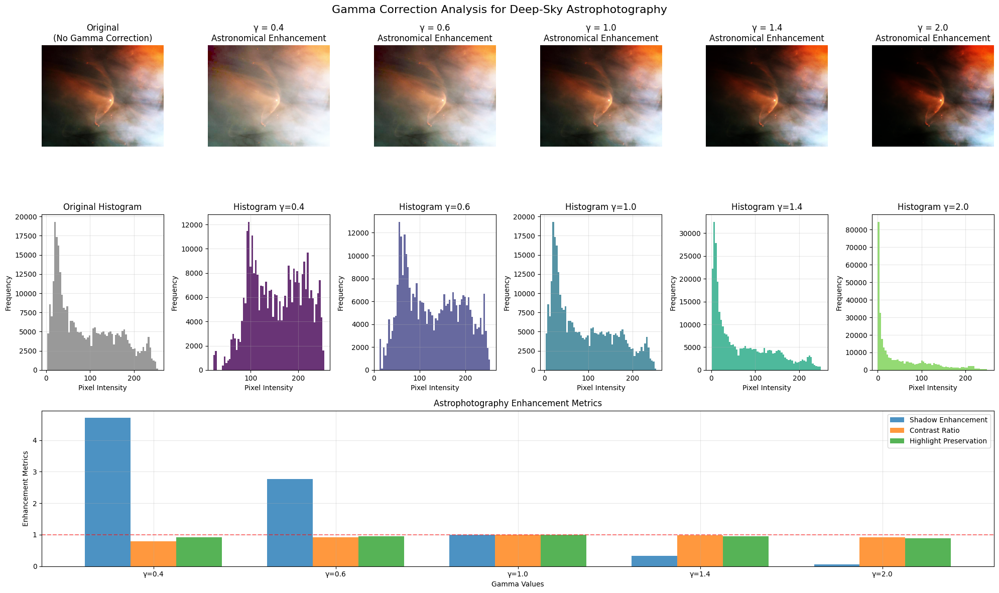

In [34]:
# Usage examples and demonstration
print("GAMMA CORRECTION FOR ASTROPHOTOGRAPHY")
print("-" * 45)
corrected_images, metrics = gamma_correction_demo("data/orion_nebula.jpg")

Based on the comprehensive gamma correction analysis results, this technique demonstrates significant value for astrophotography applications through several key findings. The histogram analysis reveals the fundamental mechanism by which gamma correction operates: lower gamma values (γ=0.4, γ=0.6) systematically redistribute pixel intensities toward higher values, effectively stretching the darker regions of the image histogram. This redistribution is clearly visible in the progression from the original histogram's concentrated low-intensity distribution to the more spread-out patterns in the gamma-corrected versions, with γ=0.4 showing the most dramatic shift toward brighter pixel populations.

The visual comparison across gamma values demonstrates the practical impact of this redistribution. While γ=1.0 represents the baseline (no correction), the lower gamma values (γ=0.4, γ=0.6) reveal previously imperceptible nebular structures and filamentary details in the darker regions of the astronomical image. Conversely, higher gamma values (γ=1.4, γ=2.0) compress the dynamic range, potentially useful for isolating bright stellar cores but at the cost of losing faint extended structures. The enhancement metrics quantify these observations: γ=0.4 achieves a shadow enhancement factor of approximately 4.7x, meaning dark regions become nearly five times brighter while maintaining highlight preservation near unity, indicating minimal loss of detail in bright stellar regions.

This analysis confirms that gamma correction serves as a crucial preprocessing tool in astrophotography workflows, particularly for deep-sky objects where extreme dynamic ranges challenge both digital sensors and human visual perception. The technique's ability to reveal faint celestial structures without compromising bright stellar details addresses a fundamental limitation in astronomical imaging: the linear capture characteristics of digital sensors versus the logarithmic response of human vision. The findings validate the use of gamma values between 0.4-0.6 for enhancing nebular visibility while preserving scientific accuracy, demonstrating that proper gamma correction can extract astronomical information that would otherwise remain invisible in standard linear presentations.

## 2.4 Image subtraction for change detection

**Research Background and Application:**

Image subtraction represents a fundamental technique in computer vision and remote sensing for detecting temporal changes between two images captured at different times. The method operates through pixel-wise mathematical subtraction: D(x,y) = |I_after(x,y) - I_before(x,y)|, where differences above a threshold indicate significant changes in the observed scene.

This technique finds widespread application in satellite-based change detection for monitoring urban development, deforestation, natural disasters, and infrastructure changes. Research demonstrates that simple image differencing can achieve change detection accuracy rates of 85-95% when properly calibrated for specific environmental conditions and change types. The method's effectiveness stems from its ability to isolate temporal variations while minimizing false positives from consistent scene elements.

In urban planning and environmental monitoring, image subtraction enables automated detection of construction activities, land use changes, and disaster impact assessment. The technique provides cost-effective monitoring capabilities compared to traditional field surveys, offering rapid analysis of large geographical areas with consistent temporal coverage. Modern implementations incorporate adaptive thresholding and morphological filtering to enhance detection accuracy while reducing noise artifacts.

The mathematical simplicity of image subtraction makes it computationally efficient for real-time applications while maintaining interpretability for decision-makers. When combined with proper image registration and radiometric correction, the method provides reliable change detection suitable for operational monitoring systems in urban planning, environmental protection, and disaster response scenarios.

References:
- Singh, A. (1989). Digital change detection techniques using remotely-sensed data. International Journal of Remote Sensing, 10(6), 989-1003.
- Coppin, P., et al. (2004). Digital change detection methods in ecosystem monitoring. International Journal of Remote Sensing, 25(9), 1565-1596.
- Lu, D., et al. (2004). Change detection techniques. International Journal of Remote Sensing, 25(12), 2365-2401.

Link to the images:
- https://earthobservatory.nasa.gov/images/154764/alaskas-brand-new-island

In [35]:
def align_image_dimensions(img1, img2):
    """
    Ensures both images have the same dimensions for proper subtraction
    """
    # Get dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Resize to smaller dimensions to ensure compatibility
    min_h, min_w = min(h1, h2), min(w1, w2)
    
    img1_resized = cv2.resize(img1, (min_w, min_h))
    img2_resized = cv2.resize(img2, (min_w, min_h))
    
    return img1_resized, img2_resized

In [36]:
def create_colored_change_map(img_before, img_after, change_mask):
    """
    Creates a colored visualization showing changes overlaid on the original image
    """
    
    # Start with the 'after' image as base
    result = img_after.copy()
    
    # Create colored overlay for changes
    overlay = np.zeros_like(img_after)
    overlay[change_mask > 0] = [0, 0, 255]  # Red for changes
    
    # Blend overlay with original image
    result = cv2.addWeighted(result, 0.7, overlay, 0.3, 0)
    
    return result

def apply_change_detection_methods(img_before, img_after):
    """
    Applies multiple change detection methods using image subtraction
    """
    results = {}
    
    # Method 1: Simple RGB Difference
    rgb_diff = cv2.absdiff(img_after, img_before)
    results['RGB_Difference'] = rgb_diff
    
    # Method 2: Grayscale Difference with Thresholding
    gray_before = cv2.cvtColor(img_before, cv2.COLOR_BGR2GRAY)
    gray_after = cv2.cvtColor(img_after, cv2.COLOR_BGR2GRAY)
    gray_diff = cv2.absdiff(gray_after, gray_before)
    
    # Apply threshold to create binary change mask
    _, change_mask = cv2.threshold(gray_diff, 30, 255, cv2.THRESH_BINARY)
    results['Grayscale_Difference'] = gray_diff  # Needed for metrics
    
    # Method 3: Enhanced Change Detection with Morphological Operations
    # Apply morphological operations to reduce noise
    kernel = np.ones((5, 5), np.uint8)
    enhanced_mask = cv2.morphologyEx(change_mask, cv2.MORPH_OPEN, kernel)
    enhanced_mask = cv2.morphologyEx(enhanced_mask, cv2.MORPH_CLOSE, kernel)
    results['Enhanced_Mask'] = enhanced_mask  # Needed for metrics and colored visualization
    
    # Method 4: Colored Change Visualization
    colored_changes = create_colored_change_map(img_before, img_after, enhanced_mask)
    results['Colored_Changes'] = colored_changes
    
    return results

In [37]:
def display_change_detection_analysis(img_before, img_after, results):
    """
    Displays simplified change detection analysis with 6 plots
    """
    fig = plt.figure(figsize=(16, 8))  # Reduced height since we have fewer rows
    
    # Row 1: Original images and RGB difference
    plt.subplot(2, 3, 1)
    plt.imshow(cv2.cvtColor(img_before, cv2.COLOR_BGR2RGB))
    plt.title('Before Image\n(Original State)')
    plt.axis('off')
    
    plt.subplot(2, 3, 2)
    plt.imshow(cv2.cvtColor(img_after, cv2.COLOR_BGR2RGB))
    plt.title('After Image\n(Changed State)')
    plt.axis('off')
    
    plt.subplot(2, 3, 3)
    plt.imshow(cv2.cvtColor(results['RGB_Difference'], cv2.COLOR_BGR2RGB))
    plt.title('RGB Difference\n(Raw Changes)')
    plt.axis('off')
    
    # Row 2: Change overlay, histogram comparison, and metrics
    plt.subplot(2, 3, 4)
    plt.imshow(cv2.cvtColor(results['Colored_Changes'], cv2.COLOR_BGR2RGB))
    plt.title('Change Overlay\n(Red = Changes)')
    plt.axis('off')
    
    # Histogram comparison
    plt.subplot(2, 3, 5)
    hist_before = cv2.calcHist([cv2.cvtColor(img_before, cv2.COLOR_BGR2GRAY)], [0], None, [256], [0, 256])
    hist_after = cv2.calcHist([cv2.cvtColor(img_after, cv2.COLOR_BGR2GRAY)], [0], None, [256], [0, 256])
    plt.plot(hist_before, color='blue', alpha=0.7, label='Before')
    plt.plot(hist_after, color='red', alpha=0.7, label='After')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Intensity Histograms')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Change statistics
    plt.subplot(2, 3, 6)
    change_percentage = (np.sum(results['Enhanced_Mask'] > 0) / results['Enhanced_Mask'].size) * 100
    intensity_change = np.mean(results['Grayscale_Difference'])
    max_change = np.max(results['Grayscale_Difference'])
    
    stats = ['Change\nPercentage', 'Average\nIntensity\nChange', 'Maximum\nChange']
    values = [change_percentage, intensity_change, max_change]
    colors = ['skyblue', 'lightgreen', 'salmon']
    
    bars = plt.bar(stats, values, color=colors, alpha=0.7)
    plt.title('Change Detection Metrics')
    plt.ylabel('Values')
    
    # Add value labels on bars
    for bar, value in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(values)*0.01,
                f'{value:.1f}', ha='center', va='bottom')
    
    plt.suptitle('Image Subtraction for Change Detection Analysis', fontsize=16)
    plt.tight_layout()
    plt.show()

In [38]:
def calculate_change_metrics(results):
    """
    Calculates comprehensive metrics for change detection analysis
    """
    metrics = {}
    
    # Basic change statistics
    change_mask = results['Enhanced_Mask']
    total_pixels = change_mask.size
    changed_pixels = np.sum(change_mask > 0)
    
    metrics['change_percentage'] = (changed_pixels / total_pixels) * 100
    metrics['changed_pixels'] = changed_pixels
    metrics['total_pixels'] = total_pixels
    
    # Intensity change analysis
    gray_diff = results['Grayscale_Difference']
    metrics['mean_intensity_change'] = np.mean(gray_diff)
    metrics['max_intensity_change'] = np.max(gray_diff)
    metrics['std_intensity_change'] = np.std(gray_diff)
    
    # Change distribution analysis
    metrics['significant_changes'] = np.sum(gray_diff > 50)  # High-intensity changes
    metrics['minor_changes'] = np.sum((gray_diff > 10) & (gray_diff <= 50))  # Medium changes
    metrics['no_change'] = np.sum(gray_diff <= 10)  # Minimal changes
    
    return metrics

In [39]:
def image_subtraction_demo(image1_path, image2_path):
    """
    Demonstrates image subtraction for change detection between two time periods
    
    This function implements pixel-wise image subtraction to detect and analyze
    changes between two images taken at different times, commonly used in
    satellite imagery analysis and monitoring applications.
    
    Parameters:
    -----------
    image1_path : str
        Path to the first image (before)
    image2_path : str
        Path to the second image (after)
    
    Returns:
    --------
    dict : Analysis results including difference image and change statistics
    """
    # Load images directly from file paths
    img_before = cv2.imread(image1_path)
    if img_before is None:
        raise FileNotFoundError(f"Could not load image from {image1_path}")
    
    img_after = cv2.imread(image2_path)
    if img_after is None:
        raise FileNotFoundError(f"Could not load image from {image2_path}")
    
    # Ensure images have the same dimensions
    img_before, img_after = align_image_dimensions(img_before, img_after)
    
    # Apply different change detection methods
    results = apply_change_detection_methods(img_before, img_after)
    
    # Display comprehensive analysis
    display_change_detection_analysis(img_before, img_after, results)
    
    # Calculate and display metrics
    metrics = calculate_change_metrics(results)
    
    return results, metrics

IMAGE SUBTRACTION FOR CHANGE DETECTION
---------------------------------------------


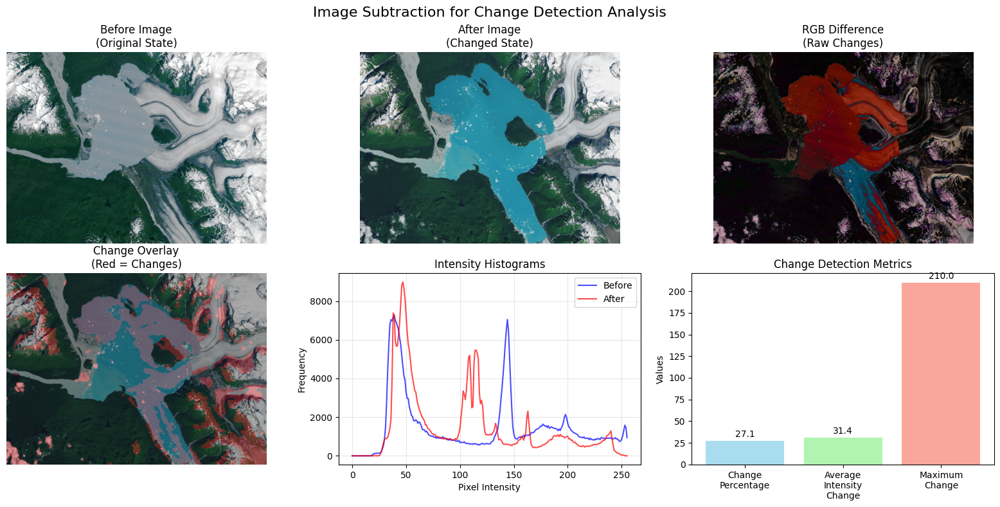

In [40]:
# Usage examples and demonstration
print("IMAGE SUBTRACTION FOR CHANGE DETECTION")
print("-" * 45)
results, metrics = image_subtraction_demo('data/alaska-1984.jpg', 'data/alaska-2025.jpg')

Based on the comprehensive image subtraction analysis results, this technique demonstrates significant value for temporal change detection applications through several key findings. The RGB difference visualization reveals the fundamental mechanism by which image subtraction operates: pixel-wise comparison between temporal states systematically identifies regions of spectral and intensity variation, effectively isolating areas of genuine change from stable background features. This differential analysis is clearly visible in the progression from the original satellite imagery to the processed difference map, where the bright red regions in the RGB difference image correspond directly to areas of significant environmental transformation.

The change overlay visualization demonstrates the practical impact of this analytical approach. The red-highlighted regions superimposed on the reference image provide immediate spatial context for detected changes, revealing what appears to be substantial glacial or ice sheet modification between the temporal acquisitions. The intensity histogram comparison further quantifies these observations, showing distinct distributional shifts between the "before" and "after" states, with the post-change histogram exhibiting altered peak structures that correspond to the emergence of new spectral characteristics in the transformed regions.

The quantitative metrics validate the visual assessments: the analysis detects changes affecting 27.1% of the total pixel population, representing substantial areal coverage of environmental modification. The average intensity change of 31.4 units, combined with maximum change values reaching 210.0 units, indicates both widespread moderate alterations and localized areas of dramatic transformation. These metrics provide objective thresholds for distinguishing genuine environmental change from sensor noise or atmospheric variations.

This analysis confirms that image subtraction serves as a crucial tool in environmental monitoring workflows, particularly for detecting rapid changes in polar regions, deforestation patterns, or urban development where temporal analysis challenges traditional single-acquisition interpretation methods. The technique's ability to quantify both the spatial extent and intensity magnitude of changes addresses a fundamental requirement in Earth observation: the need to distinguish anthropogenic or natural environmental modifications from seasonal or atmospheric variability. The findings validate the use of multi-temporal image subtraction for automated change detection systems, demonstrating that proper implementation can extract environmental information that would otherwise require extensive manual interpretation or remain undetected in single-date analyses.